In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
#Load the data set into the environment
df = pd.read_csv('/content/drive/MyDrive/loan_approval_dataset (1).csv')

In [6]:
df.shape

(4269, 13)

In [7]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [8]:
df.columns

Index(['loan_id', ' no_of_dependents', ' education', ' self_employed',
       ' income_annum', ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')

In [9]:
df.dtypes

,0
loan_id,int64
no_of_dependents,int64
education,object
self_employed,object
income_annum,int64
loan_amount,int64
loan_term,int64
cibil_score,int64
residential_assets_value,int64
commercial_assets_value,int64


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   loan_id                    4269 non-null   int64 
 1    no_of_dependents          4269 non-null   int64 
 2    education                 4269 non-null   object
 3    self_employed             4269 non-null   object
 4    income_annum              4269 non-null   int64 
 5    loan_amount               4269 non-null   int64 
 6    loan_term                 4269 non-null   int64 
 7    cibil_score               4269 non-null   int64 
 8    residential_assets_value  4269 non-null   int64 
 9    commercial_assets_value   4269 non-null   int64 
 10   luxury_assets_value       4269 non-null   int64 
 11   bank_asset_value          4269 non-null   int64 
 12   loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [11]:
df.describe()

,loan_id,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
count,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4.269000e+03,4.269000e+03
mean,2135.000000,2.498712,5.059124e+06,1.513345e+07,10.900445,599.936051,7.472617e+06,4.973155e+06,1.512631e+07,4.976692e+06
std,1232.498479,1.695910,2.806840e+06,9.043363e+06,5.709187,172.430401,6.503637e+06,4.388966e+06,9.103754e+06,3.250185e+06
min,1.000000,0.000000,2.000000e+05,3.000000e+05,2.000000,300.000000,-1.000000e+05,0.000000e+00,3.000000e+05,0.000000e+00
25%,1068.000000,1.000000,2.700000e+06,7.700000e+06,6.000000,453.000000,2.200000e+06,1.300000e+06,7.500000e+06,2.300000e+06
50%,2135.000000,3.000000,5.100000e+06,1.450000e+07,10.000000,600.000000,5.600000e+06,3.700000e+06,1.460000e+07,4.600000e+06
75%,3202.000000,4.000000,7.500000e+06,2.150000e+07,16.000000,748.000000,1.130000e+07,7.600000e+06,2.170000e+07,7.100000e+06
max,4269.000000,5.000000,9.900000e+06,3.950000e+07,20.000000,900.000000,2.910000e+07,1.940000e+07,3.920000e+07,1.470000e+07


In [12]:
df.isnull().sum()

,0
loan_id,0
no_of_dependents,0
education,0
self_employed,0
income_annum,0
loan_amount,0
loan_term,0
cibil_score,0
residential_assets_value,0
commercial_assets_value,0


In [13]:
df.duplicated().sum()

0

In [14]:
print(df.columns)

Index(['loan_id', ' no_of_dependents', ' education', ' self_employed',
       ' income_annum', ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')


In [15]:
# Dropping the id column
df.drop(columns=['loan_id'], inplace=True)

In [16]:
# Remove leading spaces from column names
df.rename(columns=lambda x: x.strip(), inplace=True)

# Display the updated DataFrame
print(df.columns)

Index(['no_of_dependents', 'education', 'self_employed', 'income_annum',
       'loan_amount', 'loan_term', 'cibil_score', 'residential_assets_value',
       'commercial_assets_value', 'luxury_assets_value', 'bank_asset_value',
       'loan_status'],
      dtype='object')


In [17]:
numeric_columns = [
    'income_annum', 'loan_amount', 'loan_term',
    'cibil_score', 'residential_assets_value',
    'commercial_assets_value', 'luxury_assets_value',
    'bank_asset_value'
]

In [18]:
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers

outliers_iqr = {col: detect_outliers_iqr(df, col) for col in numeric_columns}
print("Outlier: ", len(outliers_iqr))

Outlier:  8


In [19]:
sns.set(style="whitegrid")
custom_palette = sns.color_palette(["#81c784", "#388e3c", "#74c69d"])

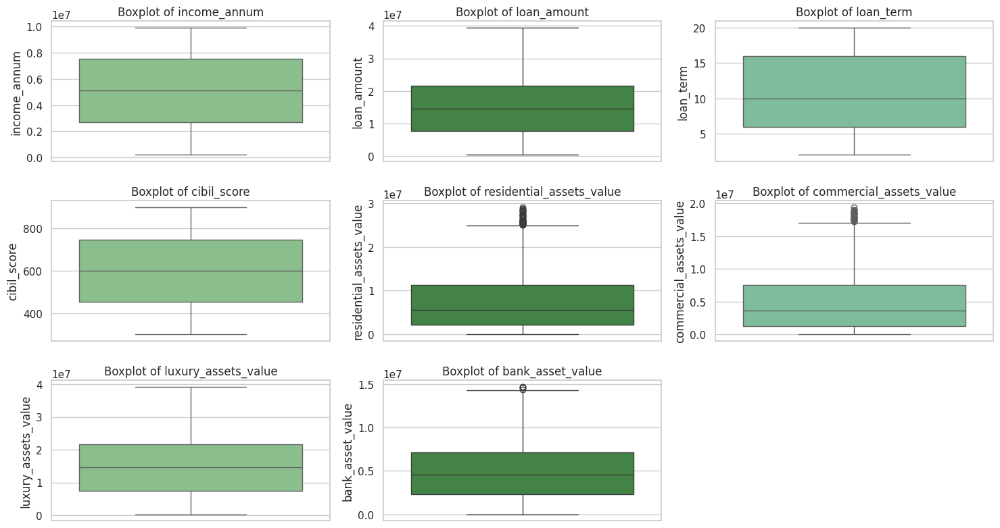

In [20]:
def plot_boxplots(df, columns):
    plt.figure(figsize=(15, 8))
    for i, col in enumerate(columns):
        plt.subplot(3, 3, i + 1)
        sns.boxplot(y=df[col], color=custom_palette[i % 3])
        plt.title(f'Boxplot of {col}')
    plt.tight_layout()
    plt.show()

plot_boxplots(df, numeric_columns)

In [21]:
def detect_outliers_zscore(df, columns, threshold=3):
    outlier_indices = []
    for col in columns:
        z_scores = np.abs(stats.zscore(df[col]))
        outlier_indices.extend(np.where(z_scores > threshold)[0])
    return set(outlier_indices)

outliers_zscore = detect_outliers_zscore(df, numeric_columns)
print(f'Number of outliers detected using Z-scores: {len(outliers_zscore)}')

Number of outliers detected using Z-scores: 33


In [22]:
df.shape

(4269, 12)

In [23]:
# df_cleaned = df.drop(index=outliers_zscore).reset_index(drop=True)

df_cleaned = df.drop(index=outliers_zscore)
print(f'Shape of DataFrame after outlier removal: {df_cleaned.shape}')

Shape of DataFrame after outlier removal: (4236, 12)


In [24]:
df_cleaned.shape

(4236, 12)

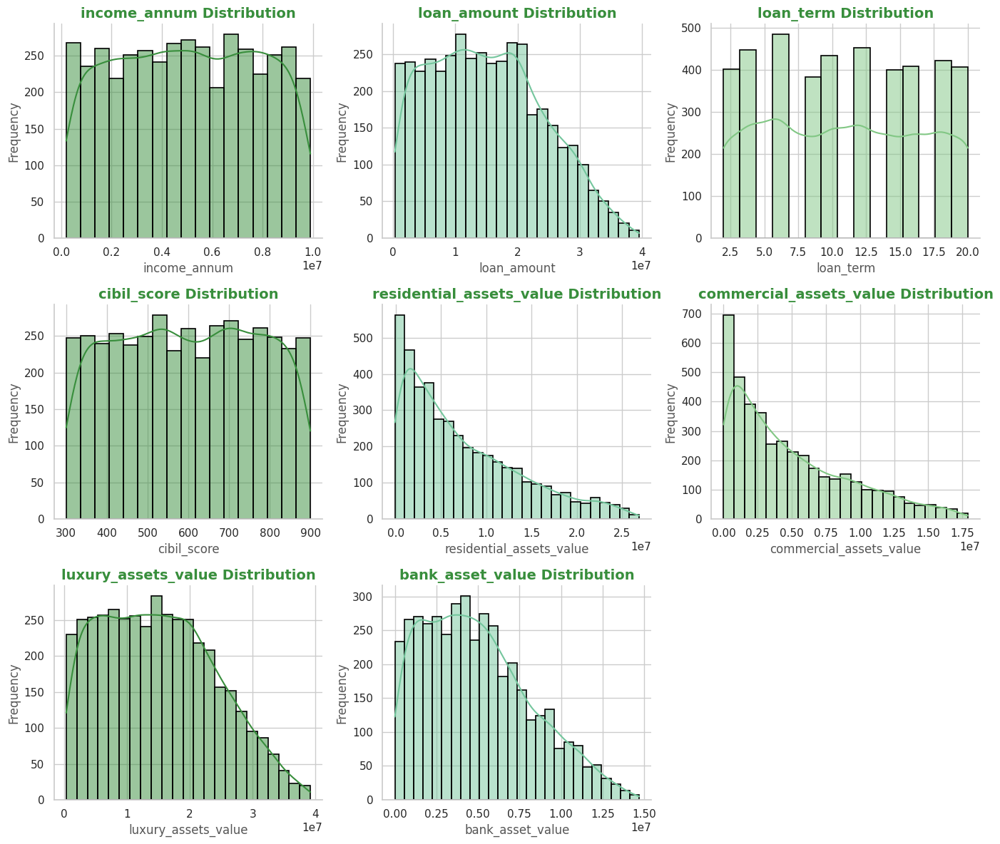

In [25]:
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(14, 12))

for idx, col in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns)//3 + 1, 3, idx)
    sns.histplot(df_cleaned[col], kde=True, color=custom_palette[idx % 3], edgecolor="black", linewidth=1.2)

    plt.title(f'{col} Distribution', fontsize=14, weight='bold', color="#388e3c")
    plt.xlabel(col, fontsize=12, color="#555555")
    plt.ylabel('Frequency', fontsize=12, color="#555555")

    sns.despine()

plt.tight_layout()
plt.show()

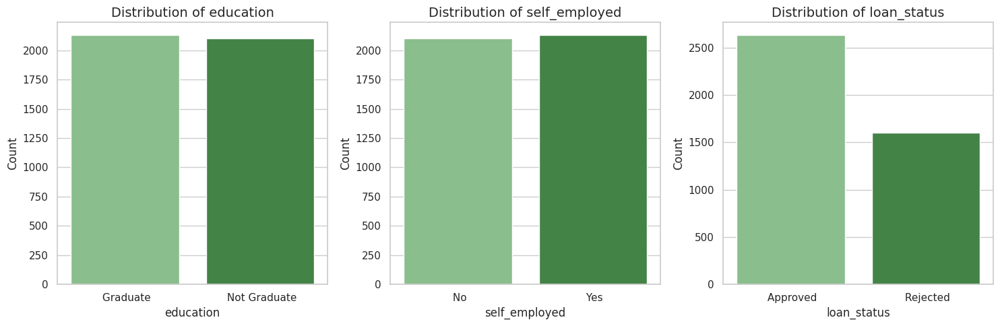

In [26]:
categorical_columns = ['education', 'self_employed', 'loan_status']

plt.figure(figsize=(15, 5))
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(1, 3, i)
    sns.countplot(x=df_cleaned[column], palette=custom_palette)
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.xlabel(column)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

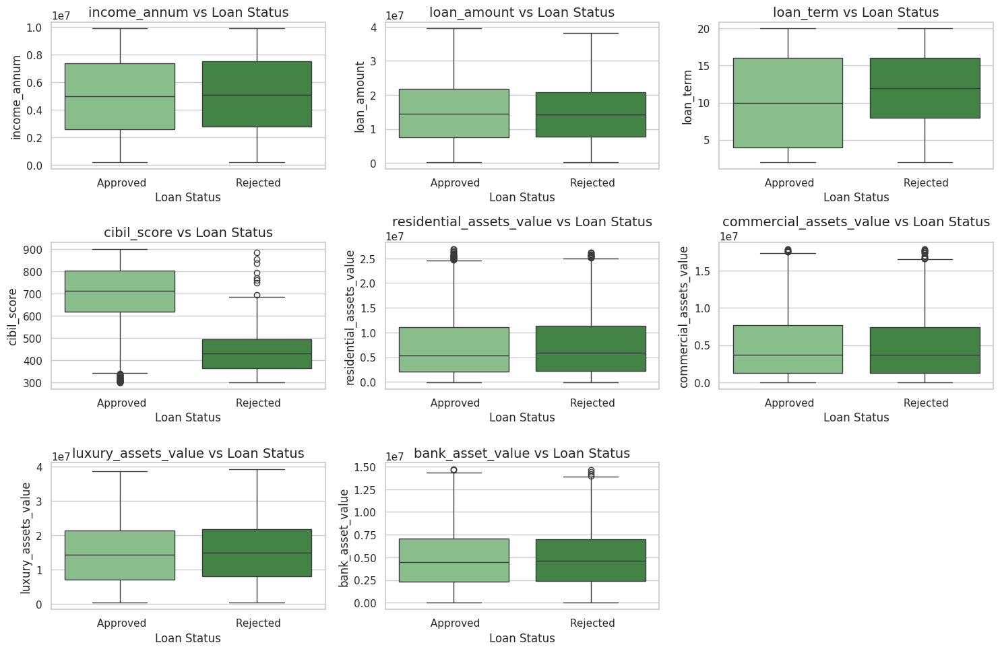

In [27]:
plt.figure(figsize=(15, 10))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x='loan_status', y=column, data=df_cleaned, palette=custom_palette)
    plt.title(f'{column} vs Loan Status', fontsize=14)
    plt.xlabel('Loan Status')
    plt.ylabel(column)
plt.tight_layout()
plt.show()

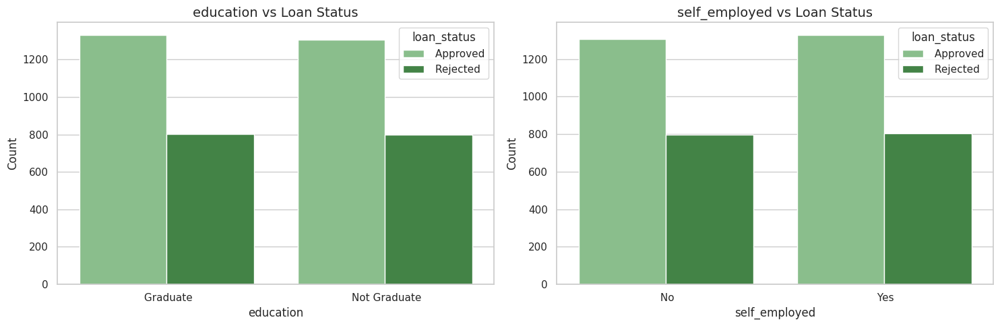

In [28]:
plt.figure(figsize=(15, 5))
for i, column in enumerate(categorical_columns[:-1], 1):
    plt.subplot(1, 2, i)
    sns.countplot(x=column, hue='loan_status', data=df_cleaned, palette=custom_palette)
    plt.title(f'{column} vs Loan Status', fontsize=14)
    plt.xlabel(column)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

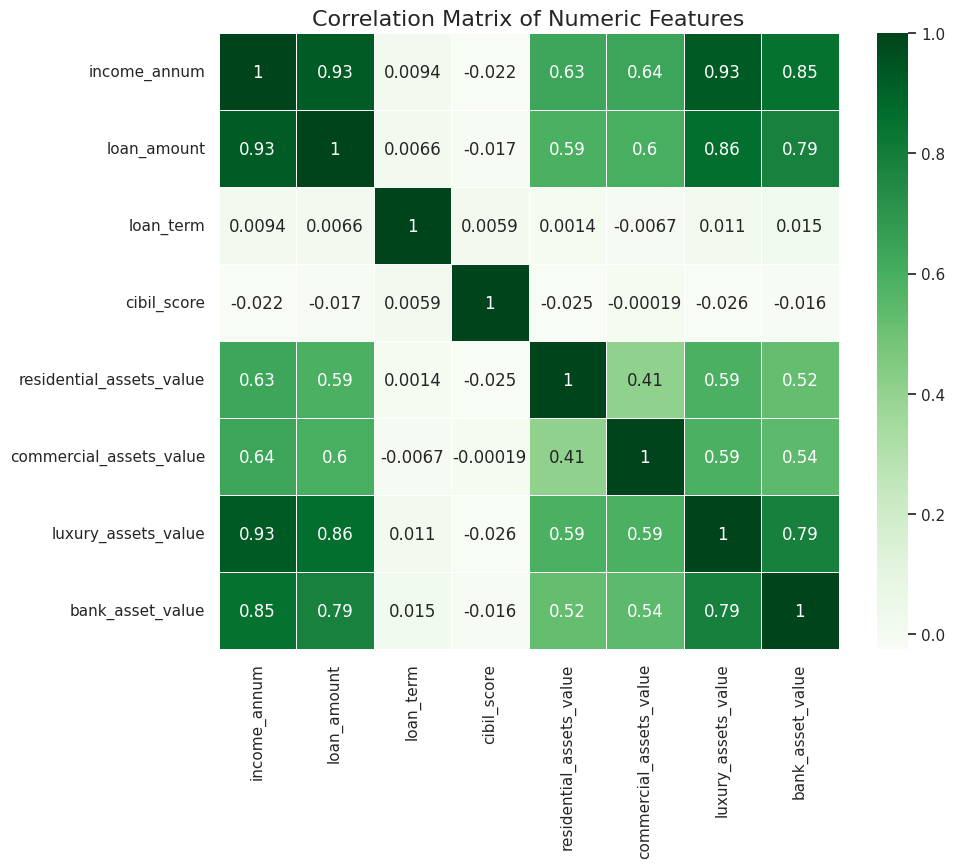

In [29]:
correlation_matrix = df_cleaned[numeric_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens', linewidths=0.5)
plt.title('Correlation Matrix of Numeric Features', fontsize=16)
plt.show()

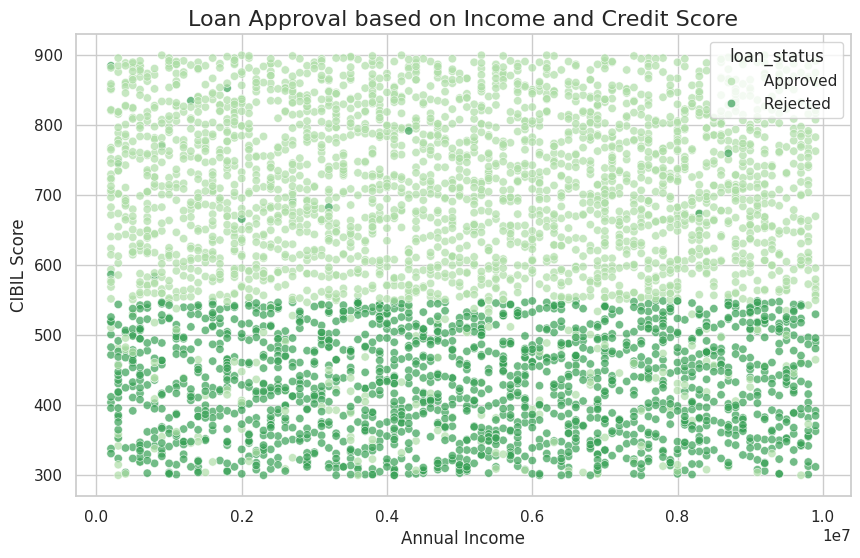

In [30]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='income_annum', y='cibil_score', hue='loan_status', data=df_cleaned, palette="Greens", alpha=0.7)
plt.title('Loan Approval based on Income and Credit Score', fontsize=16)
plt.xlabel('Annual Income')
plt.ylabel('CIBIL Score')
plt.show()

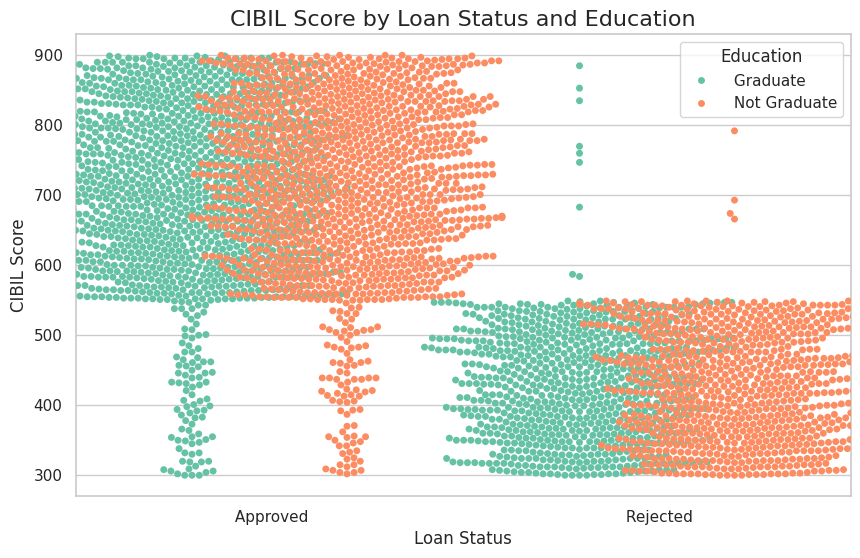

In [31]:
plt.figure(figsize=(10, 6))
sns.swarmplot(x='loan_status', y='cibil_score', data=df_cleaned, hue='education', palette='Set2', dodge=True)
plt.title('CIBIL Score by Loan Status and Education', fontsize=16)
plt.xlabel('Loan Status')
plt.ylabel('CIBIL Score')
plt.legend(title='Education')
plt.show()

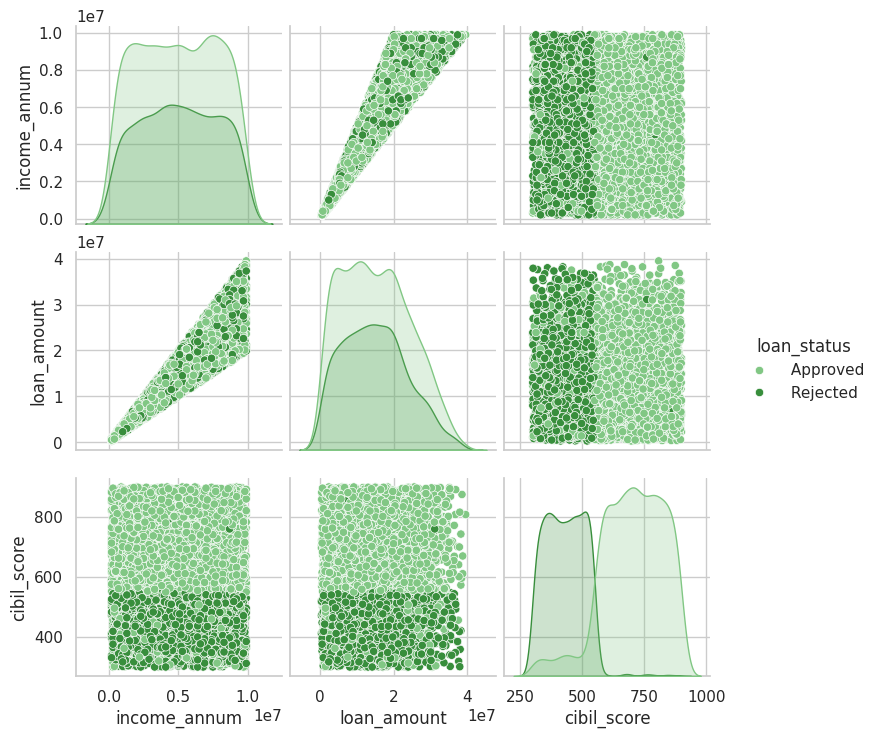

In [32]:
selected_columns = ['income_annum', 'loan_amount', 'cibil_score', 'loan_status']
sns.pairplot(df_cleaned[selected_columns], hue='loan_status', palette=custom_palette, diag_kind='kde')
plt.show()

No data for 'Approved' loan status


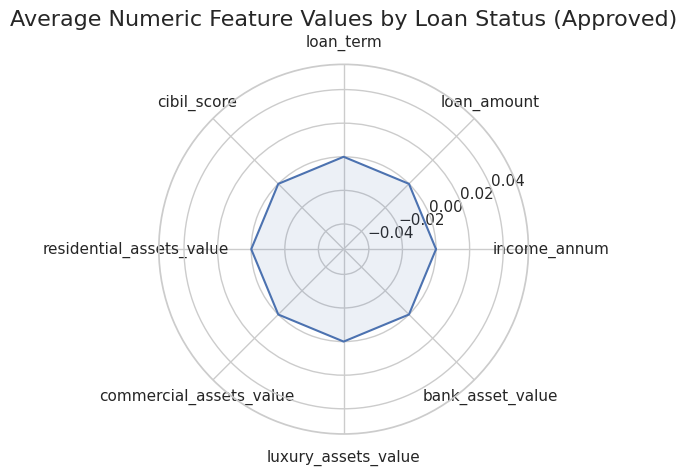

In [33]:
from math import pi

numeric_columns = df_cleaned[numeric_columns].select_dtypes(include=['number']).columns.tolist()

categories = list(numeric_columns)
group_means = df_cleaned.groupby('loan_status')[numeric_columns].mean()

if 'Approved' in group_means.index:
    values = group_means.loc['Approved'].values.flatten().tolist()
else:
    print("No data for 'Approved' loan status")
    values = [0] * len(categories)

values += values[:1]
N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

if len(angles) != len(values):
    print(f"Warning: angles ({len(angles)}) and values ({len(values)}) lengths do not match.")
    if len(values) < len(angles):
        values = values + [values[0]]
    elif len(angles) < len(values):
        angles = angles + [angles[0]]

# Plot
ax = plt.subplot(111, polar=True)
plt.xticks(angles[:-1], categories)
ax.plot(angles, values, color='b')
ax.fill(angles, values, 'b', alpha=0.1)
plt.title('Average Numeric Feature Values by Loan Status (Approved)', fontsize=16)
plt.show()

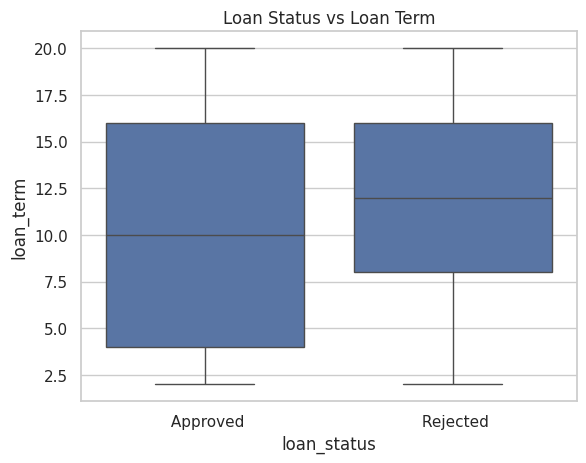

In [34]:
sns.boxplot(x="loan_status", y="loan_term", data=df_cleaned)
plt.title('Loan Status vs Loan Term')
plt.show()

In [35]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin

In [36]:
df_cleaned.isnull().sum()

,0
no_of_dependents,0
education,0
self_employed,0
income_annum,0
loan_amount,0
loan_term,0
cibil_score,0
residential_assets_value,0
commercial_assets_value,0
luxury_assets_value,0


In [37]:
def feature_engineering(X):
    X['loan_to_income_ratio'] = X['loan_amount'] / X['income_annum']
    X['total_asset_value'] = (X['residential_assets_value'] +
                              X['commercial_assets_value'] +
                              X['luxury_assets_value'] +
                              X['bank_asset_value'])

#     X['debt_to_income_ratio'] = X['loan_amount'] / X['income_annum']

    X['income_per_dependent'] = X['income_annum'] / (X['no_of_dependents'] + 1)

#     X['luxury_asset_ratio'] = X['luxury_assets_value'] / X['total_asset_value']

    def cibil_category(score):
        if score < 500:
            return 'Low'
        elif 500 <= score <= 700:
            return 'Medium'
        else:
            return 'High'

    X['cibil_category'] = X['cibil_score'].apply(cibil_category)

#     threshold_loan_amount = X['loan_amount'].quantile(0.75)
#     X['high_loan_amount_flag'] = (X['loan_amount'] > threshold_loan_amount).astype(int)

    return X

In [38]:
feature_engineering(df_cleaned)

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,loan_to_income_ratio,total_asset_value,income_per_dependent,cibil_category
0,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved,3.114583,50700000,3.200000e+06,High
1,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected,2.975610,17000000,4.100000e+06,Low
2,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected,3.263736,57700000,2.275000e+06,Medium
3,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected,3.743902,52700000,2.050000e+06,Low
4,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected,2.469388,55000000,1.633333e+06,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4264,5,Graduate,Yes,1000000,2300000,12,317,2800000,500000,3300000,800000,Rejected,2.300000,7400000,1.666667e+05,Low
4265,0,Not Graduate,Yes,3300000,11300000,20,559,4200000,2900000,11000000,1900000,Approved,3.424242,20000000,3.300000e+06,Medium
4266,2,Not Graduate,No,6500000,23900000,18,457,1200000,12400000,18100000,7300000,Rejected,3.676923,39000000,2.166667e+06,Low
4267,1,Not Graduate,No,4100000,12800000,8,780,8200000,700000,14100000,5800000,Approved,3.121951,28800000,2.050000e+06,High


In [39]:
df_cleaned.isnull().sum()

,0
no_of_dependents,0
education,0
self_employed,0
income_annum,0
loan_amount,0
loan_term,0
cibil_score,0
residential_assets_value,0
commercial_assets_value,0
luxury_assets_value,0


In [40]:
df_cleaned['loan_status'].unique()

array([' Approved', ' Rejected'], dtype=object)

In [41]:
class LabelEncoderTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.encoders = {}

    def fit(self, X, y=None):
        for column in X.columns:
            le = LabelEncoder()
            le.fit(X[column])
            self.encoders[column] = le
        return self

    def transform(self, X):
        X_copy = X.copy()
        for column in self.encoders:
            if column in X_copy.columns:
                X_copy[column] = self.encoders[column].transform(X_copy[column])
        return X_copy

In [42]:
df_cleaned.head()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,loan_to_income_ratio,total_asset_value,income_per_dependent,cibil_category
0,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved,3.114583,50700000,3.200000e+06,High
1,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected,2.975610,17000000,4.100000e+06,Low
2,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected,3.263736,57700000,2.275000e+06,Medium
3,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected,3.743902,52700000,2.050000e+06,Low
4,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected,2.469388,55000000,1.633333e+06,Low


In [43]:
df_cleaned.columns

Index(['no_of_dependents', 'education', 'self_employed', 'income_annum',
       'loan_amount', 'loan_term', 'cibil_score', 'residential_assets_value',
       'commercial_assets_value', 'luxury_assets_value', 'bank_asset_value',
       'loan_status', 'loan_to_income_ratio', 'total_asset_value',
       'income_per_dependent', 'cibil_category'],
      dtype='object')

In [44]:
numerical_features = [
    'income_annum', 'loan_amount', 'loan_term',
    'cibil_score', 'residential_assets_value',
    'commercial_assets_value', 'luxury_assets_value',
    'bank_asset_value', 'income_per_dependent'] # 'debt_to_income_ratio','income_per_dependent','luxury_asset_ratio', 'high_loan_amount_flag'

categorical_features = ['education', 'self_employed', 'cibil_category']

selected_features = numerical_features + categorical_features

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(handle_unknown="ignore"), categorical_features)
    ],
    remainder='passthrough'
)

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])

processed_data = pipeline.fit_transform(df_cleaned[selected_features])
# print(processed_data)

# Convert to DataFrame for better readability
num_features = numerical_features.copy()
all_features = num_features + categorical_features + ['education_2','self_employed_2','cibil_category_2','cibil_category_3']

# Create a DataFrame with the processed data
processed_df = pd.DataFrame(processed_data, columns=all_features)
processed_df['total_asset_value'] = df_cleaned['total_asset_value']
processed_df['loan_to_income_ratio'] = df_cleaned['loan_to_income_ratio']
processed_df['no_of_dependents'] = df_cleaned['no_of_dependents']
processed_df['loan_status'] = df_cleaned['loan_status'].values

processed_df.head()

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents,loan_status
0,1.641471,1.657663,0.193909,1.032906,-0.780184,2.953092,0.846931,0.947220,0.580813,1.0,0.0,1.0,0.0,1.0,0.0,0.0,50700000.0,3.114583,2.0,Approved
1,-0.331231,-0.314382,-0.506645,-1.062326,-0.733037,-0.628655,-0.687689,-0.508285,1.032341,0.0,1.0,0.0,1.0,0.0,1.0,0.0,17000000.0,2.975610,0.0,Rejected
2,1.462135,1.635380,1.595019,-0.545773,-0.041541,-0.093719,2.017216,2.433693,0.116743,1.0,0.0,1.0,0.0,0.0,0.0,1.0,57700000.0,3.263736,3.0,Rejected
3,1.139329,1.746795,-0.506645,-0.772128,1.702912,-0.372816,0.913173,0.916252,0.003861,1.0,0.0,1.0,0.0,0.0,1.0,0.0,52700000.0,3.743902,3.0,Rejected
4,1.713206,1.022598,1.595019,-1.265465,0.791396,0.766831,1.586639,0.018174,-0.205180,0.0,1.0,0.0,1.0,0.0,1.0,0.0,55000000.0,2.469388,5.0,Rejected


In [45]:
from sklearn import set_config

set_config(display='diagram')

# Display the pipeline
pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['income_annum',
                                                   'loan_amount', 'loan_term',
                                                   'cibil_score',
                                                   'residential_assets_value',
                                                   'commercial_assets_value',
                                                   'luxury_assets_value',
                                                   'bank_asset_value',
                                                   'income_per_dependent']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['education', 'self_employed',
                                                   'cibil_category'])]))])

In [46]:
processed_df.isnull().sum()

,0
income_annum,0
loan_amount,0
loan_term,0
cibil_score,0
residential_assets_value,0
commercial_assets_value,0
luxury_assets_value,0
bank_asset_value,0
income_per_dependent,0
education,0


In [47]:
# # Example: Fill missing values with the median
# # processed_df['total_asset_value'].fillna(processed_df['total_asset_value'].median(), inplace=True)
# # processed_df['loan_to_income_ratio'].fillna(processed_df['loan_to_income_ratio'].median(), inplace=True)
# processed_df['no_of_dependents'].fillna(processed_df['no_of_dependents'].median(), inplace=True)
# processed_df['loan_status'].fillna(processed_df['loan_status'].mode()[0], inplace=True)
# processed_df['self_employed'].fillna(processed_df['self_employed'].mode()[0], inplace=True)
# processed_df['education'].fillna(processed_df['education'].mode()[0], inplace=True)

In [48]:
processed_df.shape

(4236, 20)

In [49]:
processed_df.isnull().sum()

,0
income_annum,0
loan_amount,0
loan_term,0
cibil_score,0
residential_assets_value,0
commercial_assets_value,0
luxury_assets_value,0
bank_asset_value,0
income_per_dependent,0
education,0


In [50]:
processed_df['loan_status'].unique()

array([' Approved', ' Rejected'], dtype=object)

In [51]:
numeric_columns = processed_df.select_dtypes(include=['number']).columns
print("Numerical columns:", numeric_columns)

Numerical columns: Index(['income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'income_per_dependent',
       'education', 'self_employed', 'cibil_category', 'education_2',
       'self_employed_2', 'cibil_category_2', 'cibil_category_3',
       'total_asset_value', 'loan_to_income_ratio', 'no_of_dependents'],
      dtype='object')


In [52]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')

processed_df[numeric_columns] = imputer.fit_transform(processed_df[numeric_columns])

In [53]:
label_encoder = LabelEncoder()
processed_df['loan_status'] = label_encoder.fit_transform(processed_df['loan_status'])

In [54]:
import joblib

joblib.dump(pipeline, 'preprocessor.pkl')

['preprocessor.pkl']

In [55]:
df_cleaned.shape

(4236, 16)

In [56]:
processed_df.shape

(4236, 20)

In [57]:
processed_df.head()

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents,loan_status
0,1.641471,1.657663,0.193909,1.032906,-0.780184,2.953092,0.846931,0.947220,0.580813,1.0,0.0,1.0,0.0,1.0,0.0,0.0,50700000.0,3.114583,2.0,0
1,-0.331231,-0.314382,-0.506645,-1.062326,-0.733037,-0.628655,-0.687689,-0.508285,1.032341,0.0,1.0,0.0,1.0,0.0,1.0,0.0,17000000.0,2.975610,0.0,1
2,1.462135,1.635380,1.595019,-0.545773,-0.041541,-0.093719,2.017216,2.433693,0.116743,1.0,0.0,1.0,0.0,0.0,0.0,1.0,57700000.0,3.263736,3.0,1
3,1.139329,1.746795,-0.506645,-0.772128,1.702912,-0.372816,0.913173,0.916252,0.003861,1.0,0.0,1.0,0.0,0.0,1.0,0.0,52700000.0,3.743902,3.0,1
4,1.713206,1.022598,1.595019,-1.265465,0.791396,0.766831,1.586639,0.018174,-0.205180,0.0,1.0,0.0,1.0,0.0,1.0,0.0,55000000.0,2.469388,5.0,1


In [58]:
X = processed_df.drop(columns=['loan_status'])
y = processed_df['loan_status']

In [59]:
X.shape

(4236, 19)

In [60]:
y.head()

,loan_status
0,0
1,1
2,1
3,1
4,1


In [61]:
X.head()

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents
0,1.641471,1.657663,0.193909,1.032906,-0.780184,2.953092,0.846931,0.947220,0.580813,1.0,0.0,1.0,0.0,1.0,0.0,0.0,50700000.0,3.114583,2.0
1,-0.331231,-0.314382,-0.506645,-1.062326,-0.733037,-0.628655,-0.687689,-0.508285,1.032341,0.0,1.0,0.0,1.0,0.0,1.0,0.0,17000000.0,2.975610,0.0
2,1.462135,1.635380,1.595019,-0.545773,-0.041541,-0.093719,2.017216,2.433693,0.116743,1.0,0.0,1.0,0.0,0.0,0.0,1.0,57700000.0,3.263736,3.0
3,1.139329,1.746795,-0.506645,-0.772128,1.702912,-0.372816,0.913173,0.916252,0.003861,1.0,0.0,1.0,0.0,0.0,1.0,0.0,52700000.0,3.743902,3.0
4,1.713206,1.022598,1.595019,-1.265465,0.791396,0.766831,1.586639,0.018174,-0.205180,0.0,1.0,0.0,1.0,0.0,1.0,0.0,55000000.0,2.469388,5.0


In [62]:
X.isnull().sum()

,0
income_annum,0
loan_amount,0
loan_term,0
cibil_score,0
residential_assets_value,0
commercial_assets_value,0
luxury_assets_value,0
bank_asset_value,0
income_per_dependent,0
education,0


In [63]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import matthews_corrcoef
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

In [64]:
X.columns = X.columns.astype(str)

In [65]:
X.columns

Index(['income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'income_per_dependent',
       'education', 'self_employed', 'cibil_category', 'education_2',
       'self_employed_2', 'cibil_category_2', 'cibil_category_3',
       'total_asset_value', 'loan_to_income_ratio', 'no_of_dependents'],
      dtype='object')

In [66]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [67]:
y_train.unique()

array([0, 1])

In [68]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(),
    "LightGBM": LGBMClassifier(),
    "SVC": SVC(probability=True),
    "KNN": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB(),
    "MLP": MLPClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "Extra Trees": ExtraTreesClassifier()
}

skf = StratifiedKFold(n_splits=5)


def evaluate_model(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)

    cv_score = cross_val_score(model, X_train, y_train, cv=skf, scoring='accuracy').mean()

    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    metrics = {
        'CV Accuracy': cv_score,
        'Test Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1 Score': f1_score(y_test, y_pred),
        'MCC': matthews_corrcoef(y_test, y_pred),
        'ROC-AUC': roc_auc_score(y_test, y_prob) if y_prob is not None else 'N/A',
        'Confusion Matrix': confusion_matrix(y_test, y_pred).ravel()  # (tn, fp, fn, tp)
    }
    return metrics

In [69]:
from tabulate import tabulate
import warnings
warnings.filterwarnings('ignore')

results = {}

for model_name, model in models.items():
    print(f"Training and evaluating {model_name}...")
    metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
    results[model_name] = metrics

results_df = pd.DataFrame(results).T

results_df = results_df.sort_values(by='F1 Score', ascending=False)
results_df

Training and evaluating Logistic Regression...
Training and evaluating Decision Tree...
Training and evaluating Random Forest...
Training and evaluating XGBoost...
Training and evaluating LightGBM...
[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

,CV Accuracy,Test Accuracy,Precision,Recall,F1 Score,MCC,ROC-AUC,Confusion Matrix
LightGBM,0.979633,0.977594,0.975904,0.967164,0.971514,0.953077,0.998557,"[505, 8, 11, 324]"
Decision Tree,0.970485,0.970519,0.969697,0.955224,0.962406,0.938232,0.967865,"[503, 10, 15, 320]"
XGBoost,0.978453,0.970519,0.97546,0.949254,0.962179,0.938265,0.997283,"[505, 8, 17, 318]"
Random Forest,0.971959,0.966981,0.95549,0.961194,0.958333,0.931001,0.996637,"[498, 15, 13, 322]"
AdaBoost,0.968713,0.963443,0.957831,0.949254,0.953523,0.923423,0.993879,"[499, 14, 17, 318]"
Extra Trees,0.948343,0.936321,0.907246,0.934328,0.920588,0.867719,0.9876,"[481, 32, 22, 313]"
Logistic Regression,0.832085,0.831368,0.840426,0.707463,0.768233,0.643073,0.925001,"[468, 45, 98, 237]"
KNN,0.611569,0.588443,0.472656,0.361194,0.409475,0.104397,0.554697,"[378, 135, 214, 121]"
SVC,0.626623,0.604953,0.0,0.0,0.0,0.0,0.500905,"[513, 0, 335, 0]"
Naive Bayes,0.626623,0.604953,0.0,0.0,0.0,0.0,0.537703,"[513, 0, 335, 0]"


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

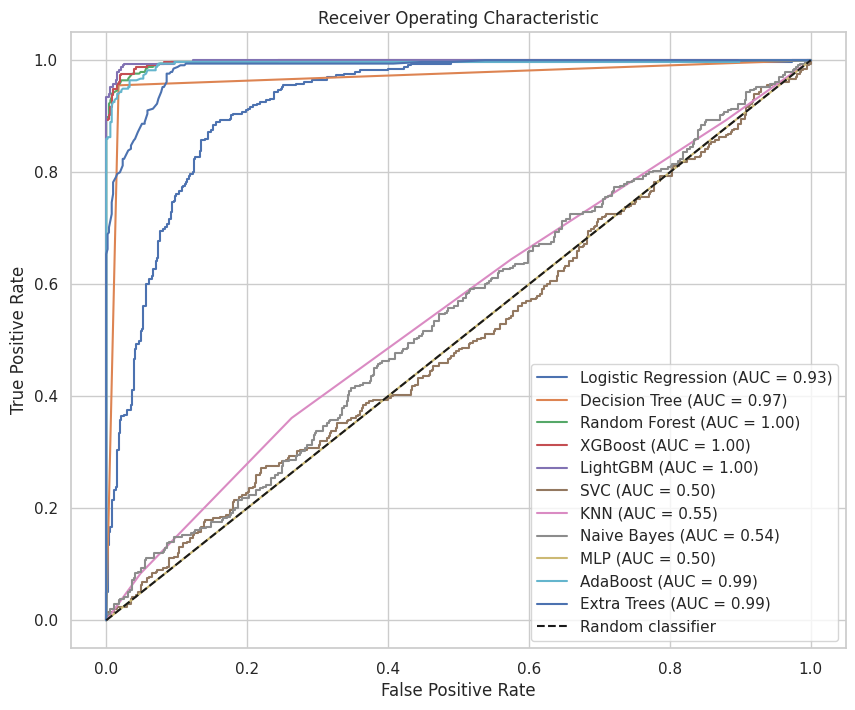

In [70]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

auc_scores = []

model_names = list(models.keys())

plt.figure(figsize=(10, 8))

for model_name in model_names:
    model = models[model_name]
    model.fit(X_train, y_train)

    if hasattr(model, "predict_proba"):
        y_pred_prob = model.predict_proba(X_test)[:, 1]

        fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
        auc_score = auc(fpr, tpr)
        auc_scores.append(auc_score)

        plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (model_name, auc_score))

plt.plot([0, 1], [0, 1], 'k--', label='Random classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')

plt.show()

In [71]:
!pip install optuna
import optuna
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.8 MB/s eta 0:00:00


In [72]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning)
def objective_lightgbm(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'num_leaves': 2 ** trial.suggest_int('max_depth', 3, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0)
    }
    model = LGBMClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

def objective_xgboost(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0)
    }
    model = XGBClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

def objective_randomforest(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    }
    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

def objective_decisiontree(trial):
    params = {
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy'])
    }
    model = DecisionTreeClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

In [73]:
def objective_logistic_regression(trial):
    params = {
        'C': trial.suggest_loguniform('C', 1e-4, 1e2),  # Regularization strength
        'penalty': trial.suggest_categorical('penalty', ['l1', 'l2']),
        'solver': trial.suggest_categorical('solver', ['liblinear', 'saga'])
    }

    model = LogisticRegression(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    return score

study_lr = optuna.create_study(direction='maximize')
study_lr.optimize(objective_logistic_regression, n_trials=30)

best_params_lr = study_lr.best_params
best_logistic_regression = LogisticRegression(**best_params_lr)

[I 2024-11-14 16:12:50,811] A new study created in memory with name: no-name-e74423fa-998b-429a-b0b0-55faf2acaa90
[I 2024-11-14 16:12:50,847] Trial 0 finished with value: 0.6049528301886793 and parameters: {'C': 0.00013702376156453854, 'penalty': 'l2', 'solver': 'liblinear'}. Best is trial 0 with value: 0.6049528301886793.
[I 2024-11-14 16:12:50,969] Trial 1 finished with value: 0.6049528301886793 and parameters: {'C': 0.16178232391447336, 'penalty': 'l1', 'solver': 'saga'}. Best is trial 0 with value: 0.6049528301886793.
[I 2024-11-14 16:12:51,036] Trial 2 finished with value: 0.6049528301886793 and parameters: {'C': 25.038729617673248, 'penalty': 'l1', 'solver': 'saga'}. Best is trial 0 with value: 0.6049528301886793.
[I 2024-11-14 16:12:51,118] Trial 3 finished with value: 0.6049528301886793 and parameters: {'C': 2.4872870687881736, 'penalty': 'l1', 'solver': 'saga'}. Best is trial 0 with value: 0.6049528301886793.
[I 2024-11-14 16:12:51,138] Trial 4 finished with value: 0.604952830

In [74]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lightgbm, n_trials=10)

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgboost, n_trials=10)

study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_randomforest, n_trials=10)

study_dt = optuna.create_study(direction='maximize')
study_dt.optimize(objective_decisiontree, n_trials=10)

best_lgbm = LGBMClassifier(**study_lgbm.best_params)
best_xgb = XGBClassifier(**study_xgb.best_params)
best_rf = RandomForestClassifier(**study_rf.best_params)
best_dt = DecisionTreeClassifier(**study_dt.best_params)
plt.show()

[I 2024-11-14 16:12:52,638] A new study created in memory with name: no-name-9e048b27-a095-4b08-8c9f-e943ccbd7d85


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2024-11-14 16:12:54,534] Trial 0 finished with value: 0.9787735849056604 and parameters: {'n_estimators': 453, 'max_depth': 9, 'learning_rate': 0.04051786793198224, 'subsample': 0.5974804655224828, 'colsample_bytree': 0.8990343642641252}. Best is trial 0 with value: 0.9787735849056604.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-11-14 16:12:55,468] Trial 1 finished with value: 0.9787735849056604 and parameters: {'n_estimators': 872, 'max_depth': 3, 'learning_rate': 0.04743185232560823, 'subsample': 0.609826984052084, 'colsample_bytree': 0.8924451381170972}. Best is trial 0 with value: 0.9787735849056604.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2024-11-14 16:12:57,774] Trial 2 finished with value: 0.9764150943396226 and parameters: {'n_estimators': 658, 'max_depth': 10, 'learning_rate': 0.07418697849507329, 'subsample': 0.941457095894949, 'colsample_bytree': 0.5505912728130231}. Best is trial 0 with value: 0.9787735849056604.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-11-14 16:13:02,363] Trial 3 finished with value: 0.9823113207547169 and parameters: {'n_estimators': 988, 'max_depth': 10, 'learning_rate': 0.04638530174601911, 'subsample': 0.6919197529891583, 'colsample_bytree': 0.978666518556834}. Best is trial 3 with value: 0.9823113207547169.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000946 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2024-11-14 16:13:04,102] Trial 4 finished with value: 0.9775943396226415 and parameters: {'n_estimators': 215, 'max_depth': 7, 'learning_rate': 0.041498724869720005, 'subsample': 0.9668890483168602, 'colsample_bytree': 0.7718131658152148}. Best is trial 3 with value: 0.9823113207547169.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-11-14 16:13:08,516] Trial 5 finished with value: 0.9764150943396226 and parameters: {'n_estimators': 514, 'max_depth': 10, 'learning_rate': 0.014634028974931957, 'subsample': 0.8480645590983227, 'colsample_bytree': 0.9285084849492584}. Best is trial 3 with value: 0.9823113207547169.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000582 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-11-14 16:13:09,748] Trial 6 finished with value: 0.9787735849056604 and parameters: {'n_estimators': 493, 'max_depth': 4, 'learning_rate': 0.055772289897196826, 'subsample': 0.8788363309146618, 'colsample_bytree': 0.9505334401782637}. Best is trial 3 with value: 0.9823113207547169.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000949 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

[I 2024-11-14 16:13:16,103] Trial 7 finished with value: 0.9787735849056604 and parameters: {'n_estimators': 997, 'max_depth': 11, 'learning_rate': 0.037420136240148574, 'subsample': 0.5183484601395614, 'colsample_bytree': 0.578260356948753}. Best is trial 3 with value: 0.9823113207547169.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-11-14 16:13:19,535] Trial 8 finished with value: 0.9811320754716981 and parameters: {'n_estimators': 684, 'max_depth': 10, 'learning_rate': 0.0933366978070093, 'subsample': 0.9108538345621937, 'colsample_bytree': 0.9967292689914624}. Best is trial 3 with value: 0.9823113207547169.


[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-11-14 16:13:21,136] Trial 9 finished with value: 0.9775943396226415 and parameters: {'n_estimators': 565, 'max_depth': 4, 'learning_rate': 0.07054590359136224, 'subsample': 0.7968595936232642, 'colsample_bytree': 0.5367957928613675}. Best is trial 3 with value: 0.9823113207547169.
[I 2024-11-14 16:13:21,140] A new study created in memory with name: no-name-94e24402-04d9-4e51-ba8c-e54d43932197
[I 2024-11-14 16:13:30,703] Trial 0 finished with value: 0.972877358490566 and parameters: {'n_estimators': 924, 'max_depth': 5, 'learning_rate': 0.08561104913545697, 'subsample': 0.5161851948953038, 'colsample_bytree': 0.7209924424624305}. Best is trial 0 with value: 0.972877358490566.
[I 2024-11-14 16:13:31,090] Trial 1 finished with value: 0.9752358490566038 and parameters: {'n_estimators': 341, 'max_depth': 12, 'learning_rate': 0.08656949277128861, 'subsample': 0.5772039430061688, 'colsample_bytree': 0.706859029549515}. Best is trial 1 with value: 0.9752358490566038.
[I 2024-11-14 16:1

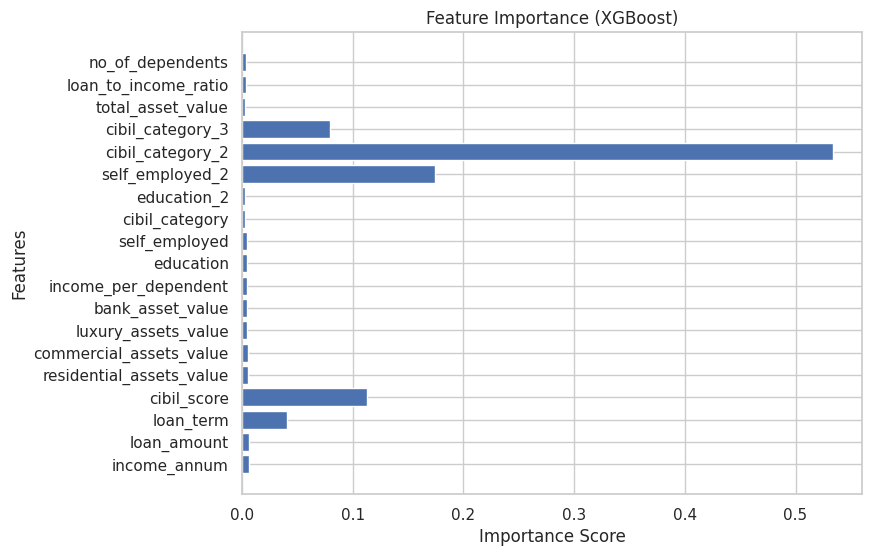

In [75]:
best_xgb.fit(X_train, y_train)

# Access and plot feature importances
importances = best_xgb.feature_importances_
plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X_train.columns)
plt.title('Feature Importance (XGBoost)')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

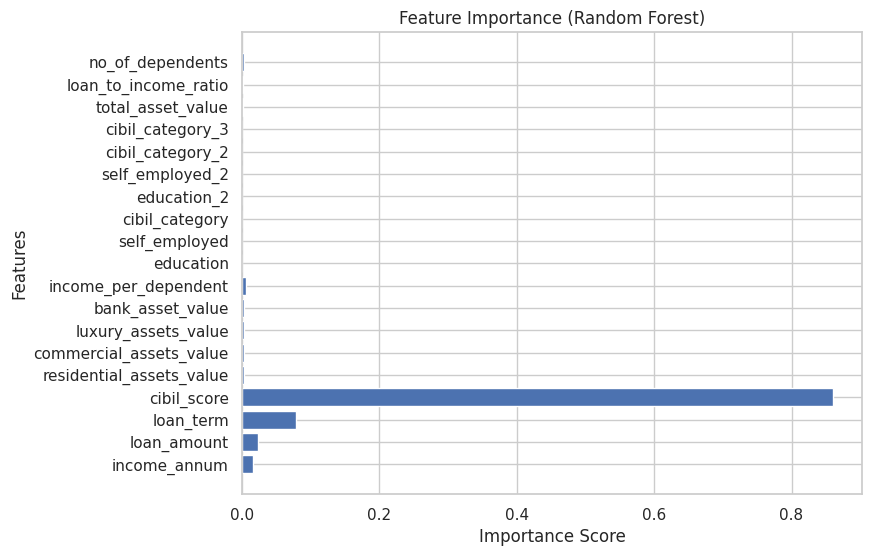

In [76]:
best_rf.fit(X_train, y_train)

# Access and plot feature importances
importances = best_rf.feature_importances_
plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X_train.columns)
plt.title('Feature Importance (Random Forest)')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

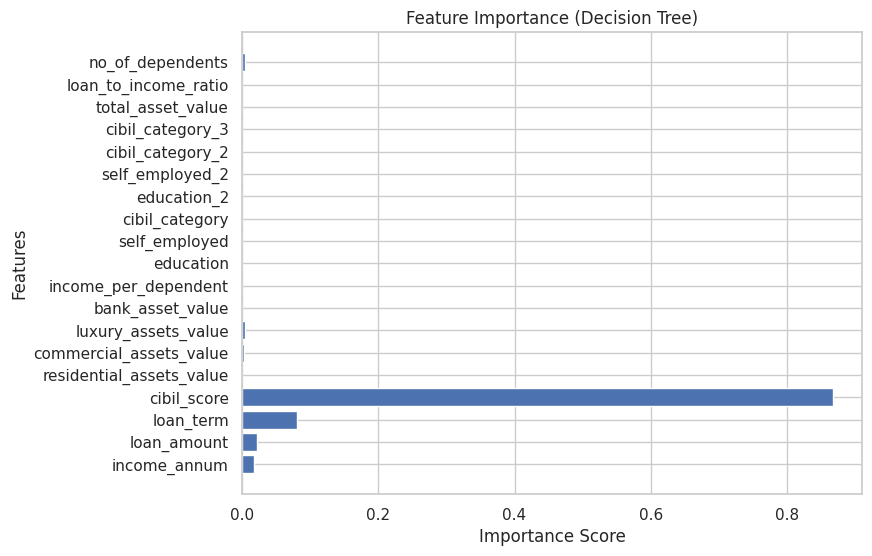

In [77]:
best_dt.fit(X_train, y_train)

# Access and plot feature importances
importances = best_dt.feature_importances_
plt.figure(figsize=(8, 6))
plt.barh(range(len(importances)), importances)
plt.yticks(range(len(importances)), X_train.columns)
plt.title('Feature Importance (Decision Tree)')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

In [78]:
stacked_model = StackingClassifier(
    estimators=[
        ('lgbm', best_lgbm),
        ('xgb', best_xgb),
        ('rf', best_rf),
        ('dt', best_dt)
    ],
    final_estimator=LogisticRegression(C= 97.51917375127391, penalty= 'l1', solver= 'liblinear')
)

stacked_model.fit(X_train, y_train)

y_pred = stacked_model.predict(X_test)

y_prob = stacked_model.predict_proba(X_test)[:, 1] if hasattr(stacked_model, "predict_proba") else None

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
mcc = matthews_corrcoef(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob) if y_prob is not None else 'N/A'

print(f"Test Accuracy: {accuracy}")
print(f"Test Precision: {precision}")
print(f"Test Recall: {recall}")
print(f"Test F1 Score: {f1}")
print(f"Test MCC: {mcc}")
print(f"Test ROC-AUC: {roc_auc}")

[LightGBM] [Info] Number of positive: 1265, number of negative: 2123
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2217
[LightGBM] [Info] Number of data points in the train set: 3388, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.373377 -> initscore=-0.517758
[LightGBM] [Info] Start training from score -0.517758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

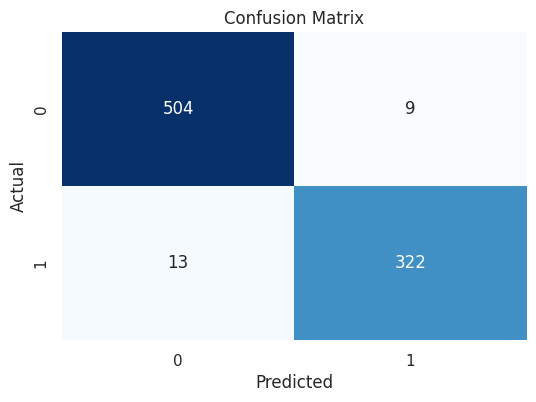

In [79]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

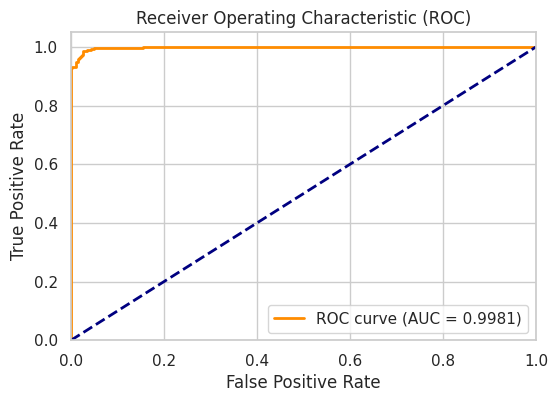

In [80]:
from sklearn.metrics import roc_curve, auc

if y_prob is not None:
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve
    plt.figure(figsize=(6, 4))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

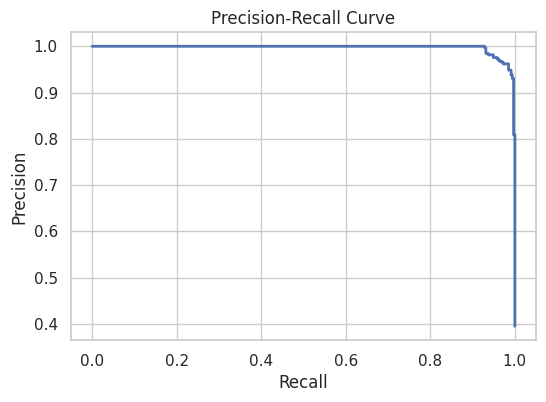

In [81]:
from sklearn.metrics import precision_recall_curve

if y_prob is not None:
    precision_vals, recall_vals, _ = precision_recall_curve(y_test, y_prob)

    # Plot Precision-Recall curve
    plt.figure(figsize=(6, 4))
    plt.plot(recall_vals, precision_vals, color='b', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.show()

In [82]:
import numpy as np
import pandas as pd
!pip install lime
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 14.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=458981fc14fb1bb0bc5408765faf4fd03a1d010007f5f4cd9214dc7abb7d246c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [83]:
explainer = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Rejected', 'Approved'],
    mode='classification'
)

In [84]:
approved_indices = np.where(y_test == 1)[0]
rejected_indices = np.where(y_test == 0)[0]

sample_indices = np.concatenate((approved_indices[:3], rejected_indices[:3]))

In [85]:
for index in sample_indices:
    instance = X_test.iloc[index].values.reshape(1, -1)
    prediction = stacked_model.predict(instance)

    exp = explainer.explain_instance(
        data_row=instance[0],
        predict_fn=stacked_model.predict_proba
    )

    exp.show_in_notebook(show_table=True, show_all=False)
    exp.save_to_file(f'lime_explanation_{index}.html')

In [86]:
import joblib

joblib.dump(stacked_model, 'stacked_model.pkl')

['stacked_model.pkl']

In [87]:
import sklearn
print(sklearn.__version__)

1.5.2


In [88]:
import xgboost
print(xgboost.__version__)

2.1.2


In [89]:
import joblib

joblib.dump(best_lgbm, 'best_lgbm.pkl')
joblib.dump(best_xgb, 'best_xgb.pkl')
joblib.dump(best_rf, 'best_rf.pkl')
joblib.dump(best_dt, 'best_dt.pkl')

['best_dt.pkl']

In [90]:
input_samples = X_train.sample(1)
input_samples

,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,income_per_dependent,education,self_employed,cibil_category,education_2,self_employed_2,cibil_category_2,cibil_category_3,total_asset_value,loan_to_income_ratio,no_of_dependents
3194,1.3904,0.833192,0.193909,1.665538,2.504418,1.371541,2.039297,1.411743,0.091658,1.0,0.0,0.0,1.0,1.0,0.0,0.0,23200000.0,2.14,0.0


In [91]:
import sklearn
print(sklearn.__version__)

1.5.2


In [92]:
# prompt: write code to find accuracy for all the models used above

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, matthews_corrcoef, roc_auc_score, confusion_matrix, roc_curve, auc, precision_recall_curve
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import StackingClassifier
from lime.lime_tabular import LimeTabularExplainer
import sklearn
import xgboost


# Assuming 'results_df' DataFrame from previous code execution

# Access the 'Test Accuracy' column
accuracy_results = results_df['Test Accuracy']

# Print or use the accuracy results
print("Accuracy scores for all models:")
accuracy_results

Accuracy scores for all models:


,Test Accuracy
LightGBM,0.977594
Decision Tree,0.970519
XGBoost,0.970519
Random Forest,0.966981
AdaBoost,0.963443
Extra Trees,0.936321
Logistic Regression,0.831368
KNN,0.588443
SVC,0.604953
Naive Bayes,0.604953
